**Yolov8 için bağımlılık yükleme**

**veri seti**

https://www.kaggle.com/datasets/robikscube/driving-video-with-object-tracking

In [1]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 898.7/898.7 kB 18.1 MB/s eta 0:00:00a 0:00:01


**YoloNas için bağımlılık yükleme**

In [2]:
!pip install super-gradients

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.7/41.7 kB 1.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 684.5/684.5 kB 14.8 MB/s eta 0:00:0000:01
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
INFO: pip is looking at multiple versions of albumentations to determine which version is compatible with other requirements. This could take a while.
INFO: pip is still looking at multiple versions of albumentations to determine which version is compatible with other requirements. This could take a while.
INFO: This is taking longer than usual. You might need to provide the dependency resolver with stricter constraints to reduce runtime. See https://pip.pypa.io/warnings/backtracking for guidance. If you want to abort this run, press Ctrl + C.
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 108.3/108.3 kB 9.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... don

In [3]:
import pandas as pd
import numpy as np
import cv2
import matplotlib.pyplot as plt
from glob import glob
import IPython.display as ipd
from tqdm import tqdm
import subprocess
plt.style.use('ggplot')

In [4]:
input_file = '../input/driving-video-with-object-tracking/bdd100k_videos_train_00/bdd100k/videos/train/026c7465-309f6d33.mov'
subprocess.run(['ffmpeg',
                '-i',
                input_file,
                '-qscale',
                '0',
                '026c7465-309f6d33.mp4',
                '-loglevel',
                'quiet']
              )

CompletedProcess(args=['ffmpeg', '-i', '../input/driving-video-with-object-tracking/bdd100k_videos_train_00/bdd100k/videos/train/026c7465-309f6d33.mov', '-qscale', '0', '026c7465-309f6d33.mp4', '-loglevel', 'quiet'], returncode=0)

In [5]:
!ls -GFlash --color

total 14M
4.0K drwxr-xr-x 3 root 4.0K Dec 16 09:13 ./
4.0K drwxr-xr-x 5 root 4.0K Dec 16 09:12 ../
4.0K drwxr-xr-x 2 root 4.0K Dec 16 09:12 .virtual_documents/
 14M -rw-r--r-- 1 root  14M Dec 16 09:14 026c7465-309f6d33.mp4


In [6]:

image_name_mp4="026c7465-309f6d33.mp4"
image_name="026c7465-309f6d33"

# Video

In [7]:
ipd.Video('026c7465-309f6d33.mp4', width=700)

# Video Bilgileri

In [8]:
cap = cv2.VideoCapture('026c7465-309f6d33.mp4')

In [9]:
cap.get(cv2.CAP_PROP_FRAME_COUNT)

2398.0

In [10]:
height = cap.get(cv2.CAP_PROP_FRAME_HEIGHT)
width = cap.get(cv2.CAP_PROP_FRAME_WIDTH)
print(f'Height {height}, Width {width}')

Height 720.0, Width 1280.0


In [11]:
fps = cap.get(cv2.CAP_PROP_FPS)
print(f'FPS : {fps:0.2f}')

FPS : 59.94


In [12]:
cap.release()

In [13]:
cap = cv2.VideoCapture('026c7465-309f6d33.mp4')
ret, img = cap.read()
print(f'Returned {ret} and img of shape {img.shape}')

Returned True and img of shape (720, 1280, 3)


In [14]:
def display_cv2_img(img, figsize=(10, 10)):
    img_ = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    fig, ax = plt.subplots(figsize=figsize)
    ax.imshow(img_)
    ax.axis("off")

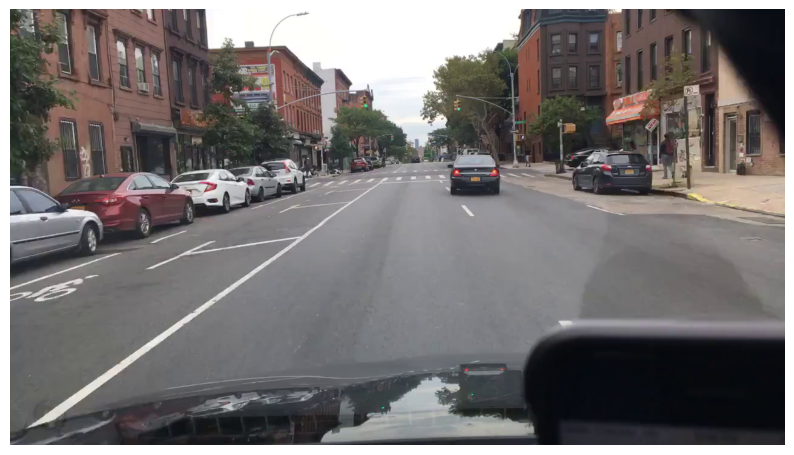

In [15]:
display_cv2_img(img)

In [16]:
cap.release()

# Videodan kareler

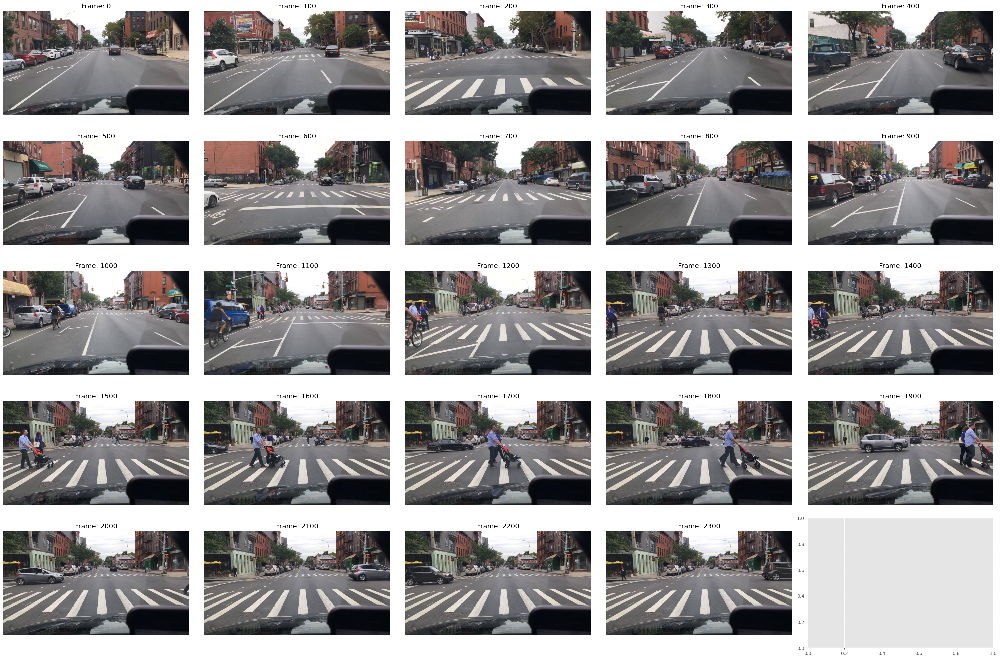

In [17]:
fig, axs = plt.subplots(5, 5, figsize=(30, 20))
axs = axs.flatten()

cap = cv2.VideoCapture("026c7465-309f6d33.mp4")
n_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))

img_idx = 0
for frame in range(n_frames):
    ret, img = cap.read()
    if ret == False:
        break
    if frame % 100 == 0:
        axs[img_idx].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        axs[img_idx].set_title(f'Frame: {frame}')
        axs[img_idx].axis('off')
        img_idx += 1

plt.tight_layout()
plt.show()
cap.release()

# Etiket dosyası


In [18]:
labels = pd.read_csv('../input/driving-video-with-object-tracking/mot_labels.csv',
                     low_memory=False)
video_labels = (
    labels.query('videoName == "026c7465-309f6d33"').reset_index(drop=True).copy()
)
video_labels["video_frame"] = (video_labels["frameIndex"] * 11.9).round().astype("int")

In [19]:
video_labels["category"].value_counts()

category
car              3030
pedestrian        847
bicycle           381
rider             320
truck             194
other vehicle     115
bus               109
other person       74
motorcycle         67
trailer            34
Name: count, dtype: int64

In [20]:

cap = cv2.VideoCapture("026c7465-309f6d33.mp4")
n_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))

img_idx = 0
for frame in range(n_frames):
    ret, img = cap.read()
    if ret == False:
        break
    if frame == 1035:
        break
cap.release()

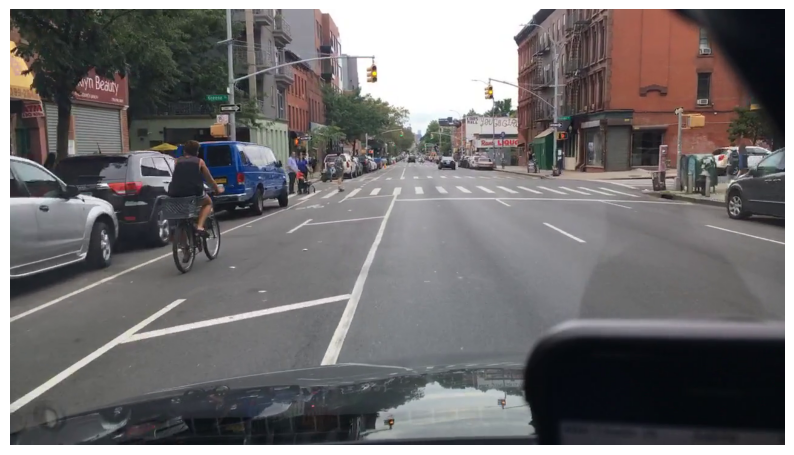

In [21]:
display_cv2_img(img)

In [22]:
labels.head(3)

,name,videoName,frameIndex,id,category,attributes.crowd,attributes.occluded,attributes.truncated,box2d.x1,box2d.x2,box2d.y1,box2d.y2,haveVideo
0,01c71072-718028b8-0000001.jpg,01c71072-718028b8,0,89537.0,car,False,True,False,825.173210,1003.094688,355.011547,418.198614,True
1,01c71072-718028b8-0000001.jpg,01c71072-718028b8,0,89538.0,car,False,True,False,484.295612,700.461894,346.697460,424.849885,True
2,01c71072-718028b8-0000001.jpg,01c71072-718028b8,0,89539.0,pedestrian,False,True,False,645.588915,663.879908,338.383372,358.337182,True


# data.yaml dosyasının oluşturulması

In [23]:
import os
import cv2
import pandas as pd
from tqdm import tqdm
import shutil
import random

output_images_dir = '/kaggle/working/images'
output_labels_dir = '/kaggle/working/labels'

train_images_dir = os.path.join(output_images_dir, 'train')
val_images_dir = os.path.join(output_images_dir, 'val')
train_labels_dir = os.path.join(output_labels_dir, 'train')
val_labels_dir = os.path.join(output_labels_dir, 'val')

os.makedirs(train_images_dir, exist_ok=True)
os.makedirs(val_images_dir, exist_ok=True)
os.makedirs(train_labels_dir, exist_ok=True)
os.makedirs(val_labels_dir, exist_ok=True)

labels = pd.read_csv('../input/driving-video-with-object-tracking/mot_labels.csv', low_memory=False)

video_labels = labels.query('videoName == "026c7465-309f6d33"').reset_index(drop=True).copy()
video_labels["video_frame"] = (video_labels["frameIndex"] * 11.9).round().astype("int")

video_path = "026c7465-309f6d33.mp4"
cap = cv2.VideoCapture(video_path)

if not cap.isOpened():
    print("Video dosyası açılamadı!")
else:
    print("Video dosyası başarıyla açıldı.")

fps = cap.get(cv2.CAP_PROP_FPS)
width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
n_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))

for frame_num in tqdm(range(n_frames), total=n_frames):
    ret, frame = cap.read()
    if not ret:
        break

    frame_labels = video_labels.query(f'video_frame == {frame_num}')
    
    if len(frame_labels) > 0:
        
        img_filename = os.path.join(output_images_dir, f"{frame_num:04d}.jpg")
        success = cv2.imwrite(img_filename, frame)
        if not success:
            print(f"Resim kaydedilemedi: {img_filename}")
            continue

        label_filename = img_filename.replace('.jpg', '.txt')
        
        try:
            with open(label_filename, 'w') as f:
                for _, row in frame_labels.iterrows():
                    class_id = row['category']
                    if class_id == 'car':
                        class_id = 0
                    elif class_id == 'pedestrian':
                        class_id = 1
                    elif class_id == 'bicycle':
                        class_id = 2
                    elif class_id == 'rider':
                        class_id = 3
                    elif class_id == 'truck':
                        class_id = 4
                    elif class_id == 'other vehicle':
                        class_id = 5
                    elif class_id == 'bus':
                        class_id = 6
                    elif class_id == 'other person':
                        class_id = 7
                    elif class_id == 'motorcycle':
                        class_id = 8
                    elif class_id == 'trailer':
                        class_id = 9

                    x_min = row['box2d.x1']
                    y_min = row['box2d.y1']
                    x_max = row['box2d.x2']
                    y_max = row['box2d.y2']
                    
                    x_center = (x_min + x_max) / 2 / width
                    y_center = (y_min + y_max) / 2 / height
                    bbox_width = (x_max - x_min) / width
                    bbox_height = (y_max - y_min) / height
                    
                    f.write(f"{class_id} {x_center} {y_center} {bbox_width} {bbox_height}\n")
        except Exception as e:
            print(f"Etiket dosyası kaydedilemedi: {label_filename}, Hata: {e}")

cap.release()

image_files = [f for f in os.listdir(output_images_dir) if f.endswith('.jpg')]
label_files = [f.replace('.jpg', '.txt') for f in image_files]

train_image_files = random.sample(image_files, int(0.8 * len(image_files)))
val_image_files = [f for f in image_files if f not in train_image_files]

for image_file in train_image_files:
    shutil.move(os.path.join(output_images_dir, image_file), os.path.join(train_images_dir, image_file))
    shutil.move(os.path.join(output_images_dir, image_file.replace('.jpg', '.txt')), os.path.join(train_labels_dir, image_file.replace('.jpg', '.txt')))

for image_file in val_image_files:
    shutil.move(os.path.join(output_images_dir, image_file), os.path.join(val_images_dir, image_file))
    shutil.move(os.path.join(output_images_dir, image_file.replace('.jpg', '.txt')), os.path.join(val_labels_dir, image_file.replace('.jpg', '.txt')))

print(f"Toplam resim dosyası: {len(image_files)}")
print(f"Eğitim seti dosyaları: {len(train_image_files)}")
print(f"Doğrulama seti dosyaları: {len(val_image_files)}")

data_yaml_content = """
# data.yaml

train: /kaggle/working/images/train  # Eğitim verisi resimleri
val: /kaggle/working/images/val      # Doğrulama verisi resimleri

# Sınıf sayısı
nc: 10

# Sınıf isimleri
names: ['car', 'pedestrian', 'bicycle', 'rider', 'truck', 'other vehicle', 'bus', 'other person', 'motorcycle', 'trailer']
"""

with open('/kaggle/working/data.yaml', 'w') as f:
    f.write(data_yaml_content)

print("Data.yaml dosyası oluşturuldu.")


Video dosyası başarıyla açıldı.


100%|██████████| 2398/2398 [00:13<00:00, 178.76it/s]

Toplam resim dosyası: 202
Eğitim seti dosyaları: 161
Doğrulama seti dosyaları: 41
Data.yaml dosyası oluşturuldu.


**Örnek Etiket**

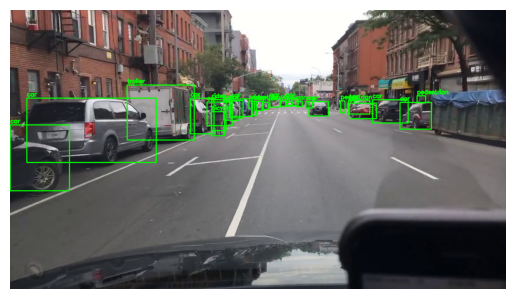

In [24]:
import os
import random
import cv2
import matplotlib.pyplot as plt

image_dir = '/kaggle/working/images/train' 
label_dir = '/kaggle/working/labels/train'

image_files = [f for f in os.listdir(image_dir) if f.endswith('.jpg')]

random_image = random.choice(image_files)

image_path = os.path.join(image_dir, random_image)
image = cv2.imread(image_path)

label_file = random_image.replace('.jpg', '.txt')
label_path = os.path.join(label_dir, label_file)

with open(label_path, 'r') as f:
    labels = f.readlines()

height, width, _ = image.shape

image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

for label in labels:
    class_id, x_center, y_center, bbox_width, bbox_height = map(float, label.split())
    
    x_min = int((x_center - bbox_width / 2) * width)
    y_min = int((y_center - bbox_height / 2) * height)
    x_max = int((x_center + bbox_width / 2) * width)
    y_max = int((y_center + bbox_height / 2) * height)
    
    cv2.rectangle(image_rgb, (x_min, y_min), (x_max, y_max), (0, 255, 0), 2)

    class_names = ['car', 'pedestrian', 'bicycle', 'rider', 'truck', 'other vehicle', 'bus', 'other person', 'motorcycle', 'trailer']
    class_name = class_names[int(class_id)]
    cv2.putText(image_rgb, class_name, (x_min, y_min - 5), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

plt.imshow(image_rgb)
plt.axis('off')
plt.show()


In [25]:
yaml_file_path = '/kaggle/working/data.yaml'

with open(yaml_file_path, 'r') as file:
    data_yaml_content = file.read()

print(data_yaml_content)



# data.yaml

train: /kaggle/working/images/train  # Eğitim verisi resimleri
val: /kaggle/working/images/val      # Doğrulama verisi resimleri

# Sınıf sayısı
nc: 10

# Sınıf isimleri
names: ['car', 'pedestrian', 'bicycle', 'rider', 'truck', 'other vehicle', 'bus', 'other person', 'motorcycle', 'trailer']



In [26]:
wandb_api="caea93784eeec577cc5df12c0cfa1523c92e980f"

In [27]:
!pip install ray[tune]

# YOLONAS

In [28]:
from ultralytics import YOLO
import torch
import torch.nn as nn
import time

yoloNAS = YOLO("yolov8n.pt")  

class CustomBackbone(nn.Module):
    def __init__(self):
        super().__init__()
        self.conv1 = nn.Conv2d(3, 64, kernel_size=3, stride=1)
        self.conv2 = nn.Conv2d(64, 128, kernel_size=3, stride=1)
        self.conv3 = nn.Conv2d(128, 256, kernel_size=3, stride=1)
        self.pool = nn.MaxPool2d(2, 2)

    def forward(self, x):
        x = self.pool(self.conv1(x))
        x = self.pool(self.conv2(x))
        x = self.pool(self.conv3(x))
        return x

yoloNAS.model.backbone = CustomBackbone()

data_yaml_path = '/kaggle/working/data.yaml'  # Data.yaml dosyasının yolu

start_time = time.time()

results = yoloNAS.train(
    data=data_yaml_path, 
    epochs=100,         
    imgsz=640,          
    batch=32,           
    lr0=0.01,          
    lrf=0.1,           
    weight_decay=0.0001, 
    augment=True,      
    optimizer='Adam',  
    workers=4,          
    device=0,           
    patience=0          
)

end_time = time.time()
training_time = end_time - start_time
print(f"Model {yoloNAS} eğitimi tamamlandı. Toplam süre: {training_time/60:.2f} dakika.")
yoloNAS.save("yoloNAS_model.pt")

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


100%|██████████| 6.25M/6.25M [00:00<00:00, 83.8MB/s]


Ultralytics 8.3.49 🚀 Python-3.10.14 torch-2.4.0 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/kaggle/working/data.yaml, epochs=100, time=None, patience=0, batch=32, imgsz=640, save=True, save_period=-1, cache=False, device=0, workers=4, project=None, name=train, exist_ok=False, pretrained=True, optimizer=Adam, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=True, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_boxes=True, line_

100%|██████████| 755k/755k [00:00<00:00, 16.5MB/s]


Overriding model.yaml nc=80 with nc=10

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytic

100%|██████████| 5.35M/5.35M [00:00<00:00, 74.1MB/s]


AMP: checks passed ✅


train: Scanning /kaggle/working/labels/train... 161 images, 0 backgrounds, 0 corrupt: 100%|██████████| 161/161 [00:00<00:00, 1100.60it/s]

train: New cache created: /kaggle/working/labels/train.cache


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


val: Scanning /kaggle/working/labels/val... 41 images, 0 backgrounds, 0 corrupt: 100%|██████████| 41/41 [00:00<00:00, 1123.68it/s]

val: New cache created: /kaggle/working/labels/val.cache


Plotting labels to runs/detect/train/labels.jpg... 
optimizer: Adam(lr=0.01, momentum=0.937) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0001), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 4 dataloader workers
Logging results to runs/detect/train
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/100      5.53G      2.339      4.268      1.318         99        640: 100%|██████████| 6/6 [00:03<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.41s/it]

                   all         41       1063    0.00318     0.0461    0.00291   0.000908



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/100      5.41G      2.514      2.671      1.344         26        640: 100%|██████████| 6/6 [00:01<00:00,  3.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.82it/s]

                   all         41       1063    0.00381     0.0571     0.0046    0.00135



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/100      5.81G       2.32       2.21      1.397         29        640: 100%|██████████| 6/6 [00:01<00:00,  3.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.71it/s]

                   all         41       1063    0.00445     0.0525    0.00574    0.00205



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/100      5.03G      2.295      2.084      1.432         14        640: 100%|██████████| 6/6 [00:01<00:00,  3.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.39it/s]

                   all         41       1063     0.0161     0.0337    0.00971    0.00366



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/100      5.36G      2.245      1.848      1.325         95        640: 100%|██████████| 6/6 [00:01<00:00,  3.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.25it/s]

                   all         41       1063        0.1   0.000485   3.72e-05   7.44e-06



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/100      5.09G      2.233      1.715      1.314         93        640: 100%|██████████| 6/6 [00:01<00:00,  3.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.65it/s]

                   all         41       1063   0.000116     0.0148   7.62e-05   1.68e-05



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/100      5.52G      2.134      1.617      1.289         27        640: 100%|██████████| 6/6 [00:01<00:00,  3.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.65it/s]

                   all         41       1063    0.00571    0.00369    0.00295   0.000582



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/100      5.17G      2.142      1.622      1.333         24        640: 100%|██████████| 6/6 [00:01<00:00,  3.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.28it/s]

                   all         41       1063      0.112    0.00427    0.00106   0.000242



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/100      5.42G      2.315      1.638      1.318         84        640: 100%|██████████| 6/6 [00:01<00:00,  3.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.15it/s]

                   all         41       1063   0.000849     0.0108    0.00047   0.000212



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/100      5.45G       2.07      1.532      1.317         20        640: 100%|██████████| 6/6 [00:01<00:00,  3.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.98it/s]

                   all         41       1063    0.00715     0.0525    0.00389   0.000629



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/100      5.37G      2.035      1.468      1.253         87        640: 100%|██████████| 6/6 [00:01<00:00,  3.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.81it/s]

                   all         41       1063      0.217     0.0572     0.0268    0.00973



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/100      5.55G      2.001      1.433      1.267         63        640: 100%|██████████| 6/6 [00:01<00:00,  3.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.48it/s]

                   all         41       1063      0.466     0.0489       0.03     0.0106



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/100      5.14G      2.021      1.463      1.304         25        640: 100%|██████████| 6/6 [00:01<00:00,  3.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.40it/s]

                   all         41       1063      0.463     0.0549     0.0474      0.018



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/100      5.93G      1.935       1.32      1.263         40        640: 100%|██████████| 6/6 [00:01<00:00,  3.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.57it/s]

                   all         41       1063      0.352     0.0774      0.094     0.0401



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/100      5.26G      2.087      1.418      1.294         35        640: 100%|██████████| 6/6 [00:01<00:00,  3.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.58it/s]

                   all         41       1063      0.292      0.204      0.164     0.0723



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/100      5.76G      1.929       1.33      1.212         18        640: 100%|██████████| 6/6 [00:01<00:00,  3.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.75it/s]

                   all         41       1063      0.559       0.16      0.175     0.0669



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/100      5.87G      1.915      1.274      1.184         33        640: 100%|██████████| 6/6 [00:01<00:00,  3.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.43it/s]

                   all         41       1063      0.442      0.259      0.266      0.128



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/100      5.27G      1.838      1.231      1.186         58        640: 100%|██████████| 6/6 [00:01<00:00,  3.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.36it/s]

                   all         41       1063      0.383      0.207      0.194     0.0865



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/100      5.39G      1.898      1.291      1.238         46        640: 100%|██████████| 6/6 [00:01<00:00,  3.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.72it/s]

                   all         41       1063      0.874      0.123      0.219      0.101



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/100       5.4G      1.932       1.23       1.16        109        640: 100%|██████████| 6/6 [00:01<00:00,  3.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.92it/s]

                   all         41       1063        0.6      0.294      0.317      0.148



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/100      5.18G      1.804      1.217      1.163         30        640: 100%|██████████| 6/6 [00:01<00:00,  3.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.69it/s]

                   all         41       1063      0.641      0.115      0.175      0.068



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/100      5.99G      1.799      1.158      1.147         98        640: 100%|██████████| 6/6 [00:01<00:00,  3.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.46it/s]

                   all         41       1063      0.516      0.253      0.286      0.137



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/100      5.14G      1.758      1.137      1.147         55        640: 100%|██████████| 6/6 [00:01<00:00,  3.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.48it/s]

                   all         41       1063      0.306      0.373      0.295      0.147



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/100      5.71G      1.752      1.124      1.158         48        640: 100%|██████████| 6/6 [00:01<00:00,  3.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.48it/s]

                   all         41       1063      0.344      0.313       0.28      0.128



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/100      5.39G      1.721      1.104      1.136         98        640: 100%|██████████| 6/6 [00:01<00:00,  3.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.18it/s]

                   all         41       1063      0.362      0.292      0.231      0.111



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/100      6.16G      1.709      1.086      1.118         64        640: 100%|██████████| 6/6 [00:01<00:00,  3.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.56it/s]

                   all         41       1063      0.362      0.328      0.258      0.142



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/100      5.71G      1.718       1.12      1.147        100        640: 100%|██████████| 6/6 [00:01<00:00,  3.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.69it/s]

                   all         41       1063      0.648      0.242      0.266      0.118



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/100      5.59G      1.671      1.078      1.131         49        640: 100%|██████████| 6/6 [00:01<00:00,  3.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.58it/s]

                   all         41       1063      0.396      0.421      0.423      0.197



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/100       5.1G      1.675      1.057       1.13         39        640: 100%|██████████| 6/6 [00:01<00:00,  3.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.89it/s]

                   all         41       1063      0.595      0.284      0.378      0.186



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/100      5.27G      1.679       1.03      1.119         14        640: 100%|██████████| 6/6 [00:01<00:00,  3.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.84it/s]

                   all         41       1063      0.526      0.458       0.47      0.245



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/100      5.21G       1.68        1.1      1.116         16        640: 100%|██████████| 6/6 [00:01<00:00,  3.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.76it/s]

                   all         41       1063      0.515      0.336      0.368      0.168



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/100       5.3G      1.694      1.023      1.099        100        640: 100%|██████████| 6/6 [00:01<00:00,  3.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.58it/s]

                   all         41       1063      0.733      0.292      0.375      0.176



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/100       5.7G      1.642      1.017      1.114         64        640: 100%|██████████| 6/6 [00:01<00:00,  3.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.79it/s]

                   all         41       1063      0.711      0.317      0.428      0.209



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/100      5.94G      1.621      1.003      1.106         53        640: 100%|██████████| 6/6 [00:01<00:00,  3.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.16it/s]

                   all         41       1063      0.651      0.418      0.482      0.229



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/100      5.03G      1.524     0.9569      1.079         20        640: 100%|██████████| 6/6 [00:01<00:00,  3.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.74it/s]

                   all         41       1063      0.686      0.445      0.516      0.271



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/100      5.07G      1.587     0.9371      1.066         63        640: 100%|██████████| 6/6 [00:01<00:00,  3.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.89it/s]

                   all         41       1063      0.661      0.433      0.508      0.237



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/100      5.14G      1.549     0.9631      1.075         48        640: 100%|██████████| 6/6 [00:01<00:00,  3.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.50it/s]

                   all         41       1063      0.674      0.392      0.473      0.241



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/100      6.24G      1.578     0.9507      1.105         24        640: 100%|██████████| 6/6 [00:01<00:00,  3.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.73it/s]

                   all         41       1063      0.628      0.475      0.543      0.293



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/100      5.06G       1.48     0.9103      1.072         27        640: 100%|██████████| 6/6 [00:01<00:00,  3.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.57it/s]

                   all         41       1063      0.632      0.481      0.561      0.303



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/100       5.1G       1.51     0.9184      1.075         22        640: 100%|██████████| 6/6 [00:01<00:00,  3.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.58it/s]

                   all         41       1063      0.624      0.442      0.547        0.3



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/100      5.71G      1.553     0.9556      1.083         52        640: 100%|██████████| 6/6 [00:01<00:00,  3.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.30it/s]

                   all         41       1063       0.65      0.465      0.552      0.323



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/100      5.95G      1.507     0.9544      1.089         24        640: 100%|██████████| 6/6 [00:01<00:00,  3.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.69it/s]

                   all         41       1063      0.696      0.516      0.587      0.332



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/100      5.37G      1.578     0.9298      1.058         98        640: 100%|██████████| 6/6 [00:01<00:00,  3.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.88it/s]

                   all         41       1063      0.677      0.536      0.598      0.333



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/100       5.5G      1.466     0.8665      1.034         20        640: 100%|██████████| 6/6 [00:01<00:00,  3.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.78it/s]

                   all         41       1063      0.617      0.529      0.546      0.289



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/100       5.5G      1.463     0.8771      1.039         58        640: 100%|██████████| 6/6 [00:01<00:00,  3.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.85it/s]

                   all         41       1063      0.683      0.493       0.54      0.307



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/100       5.9G      1.471     0.8938      1.038         20        640: 100%|██████████| 6/6 [00:01<00:00,  3.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.33it/s]

                   all         41       1063      0.626      0.537      0.585      0.311



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/100      5.48G      1.447     0.8797       1.06         13        640: 100%|██████████| 6/6 [00:01<00:00,  3.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.83it/s]

                   all         41       1063      0.723      0.527      0.593      0.322



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/100      5.31G      1.473     0.8928      1.047         40        640: 100%|██████████| 6/6 [00:01<00:00,  3.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.61it/s]

                   all         41       1063      0.854      0.528      0.607       0.34



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/100       5.2G      1.474     0.8708      1.037         83        640: 100%|██████████| 6/6 [00:01<00:00,  3.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.87it/s]

                   all         41       1063      0.837      0.564      0.627      0.354



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/100      5.63G      1.434     0.9442       1.09         23        640: 100%|██████████| 6/6 [00:01<00:00,  3.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.75it/s]

                   all         41       1063      0.791      0.549      0.605      0.337



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/100      5.63G      1.434     0.8389      1.044         32        640: 100%|██████████| 6/6 [00:01<00:00,  3.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.81it/s]

                   all         41       1063      0.842      0.524      0.613      0.357



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/100      5.57G      1.447     0.8452      1.029         24        640: 100%|██████████| 6/6 [00:01<00:00,  3.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.64it/s]

                   all         41       1063       0.84      0.564      0.641      0.368



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/100      5.48G      1.387     0.8244      1.032         31        640: 100%|██████████| 6/6 [00:01<00:00,  3.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.75it/s]

                   all         41       1063      0.786      0.591       0.65      0.378



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/100      5.84G      1.352     0.7986       1.02         36        640: 100%|██████████| 6/6 [00:01<00:00,  3.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.51it/s]

                   all         41       1063      0.819      0.547      0.641      0.359



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/100      5.98G      1.365     0.8087          1         42        640: 100%|██████████| 6/6 [00:01<00:00,  3.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.82it/s]

                   all         41       1063      0.704      0.607      0.643       0.36



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/100      5.31G      1.449     0.8316      1.038         23        640: 100%|██████████| 6/6 [00:01<00:00,  3.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.37it/s]

                   all         41       1063      0.708      0.565      0.641      0.355



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/100      6.09G      1.401     0.8327      1.022         38        640: 100%|██████████| 6/6 [00:01<00:00,  3.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.66it/s]

                   all         41       1063      0.806      0.543      0.658       0.38



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/100      5.11G      1.421     0.8304       1.02         88        640: 100%|██████████| 6/6 [00:01<00:00,  3.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.79it/s]

                   all         41       1063      0.693      0.541        0.6      0.354



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/100      5.37G       1.43     0.8181      1.027         64        640: 100%|██████████| 6/6 [00:01<00:00,  3.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.93it/s]

                   all         41       1063      0.772      0.602      0.654      0.388



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/100      5.88G      1.432     0.8363      1.047         32        640: 100%|██████████| 6/6 [00:01<00:00,  3.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.89it/s]

                   all         41       1063      0.754      0.553      0.632      0.373



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/100      5.86G      1.314     0.7745     0.9916         34        640: 100%|██████████| 6/6 [00:01<00:00,  3.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.69it/s]

                   all         41       1063      0.704      0.577      0.641      0.367



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/100      6.05G      1.317     0.8065      1.018         47        640: 100%|██████████| 6/6 [00:01<00:00,  3.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.66it/s]

                   all         41       1063      0.711      0.552      0.601      0.349



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/100      5.62G      1.371     0.8149      1.022         27        640: 100%|██████████| 6/6 [00:01<00:00,  3.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.85it/s]

                   all         41       1063      0.736      0.546      0.608      0.337



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/100      6.06G      1.399     0.8287      1.025         51        640: 100%|██████████| 6/6 [00:01<00:00,  3.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.70it/s]

                   all         41       1063      0.808      0.551      0.634      0.351



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/100      5.51G      1.312     0.7705     0.9869         44        640: 100%|██████████| 6/6 [00:01<00:00,  3.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.55it/s]

                   all         41       1063      0.859      0.519      0.632      0.362



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/100      5.75G      1.362     0.7824     0.9912         91        640: 100%|██████████| 6/6 [00:01<00:00,  3.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.85it/s]

                   all         41       1063      0.829      0.566      0.636      0.379



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/100      5.18G      1.375     0.7627     0.9768         27        640: 100%|██████████| 6/6 [00:01<00:00,  3.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.74it/s]

                   all         41       1063      0.817      0.551      0.631      0.378



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/100      5.14G      1.293     0.7657      1.014         16        640: 100%|██████████| 6/6 [00:01<00:00,  3.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.74it/s]

                   all         41       1063      0.834      0.594       0.66      0.389



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/100      5.06G      1.298     0.7568     0.9834         59        640: 100%|██████████| 6/6 [00:01<00:00,  3.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.19it/s]

                   all         41       1063      0.781      0.587      0.646      0.384



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/100       4.9G      1.315     0.7721     0.9918         23        640: 100%|██████████| 6/6 [00:01<00:00,  3.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.77it/s]

                   all         41       1063      0.783      0.549      0.638      0.387



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/100      5.35G      1.343     0.7745     0.9824         64        640: 100%|██████████| 6/6 [00:01<00:00,  3.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.87it/s]

                   all         41       1063      0.895      0.566      0.645      0.392



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/100      5.68G      1.343     0.8334       1.02         16        640: 100%|██████████| 6/6 [00:01<00:00,  3.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.91it/s]

                   all         41       1063      0.856      0.575      0.647        0.4



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/100      5.53G      1.288      0.733     0.9878         26        640: 100%|██████████| 6/6 [00:01<00:00,  3.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.84it/s]

                   all         41       1063      0.767      0.586      0.656      0.401



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/100      5.06G      1.291     0.7511      1.027         29        640: 100%|██████████| 6/6 [00:01<00:00,  3.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.79it/s]

                   all         41       1063       0.73      0.612      0.667      0.401



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/100      5.47G      1.303     0.7486      0.985         21        640: 100%|██████████| 6/6 [00:01<00:00,  3.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.70it/s]

                   all         41       1063      0.741      0.612      0.669      0.411



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/100      5.07G      1.262     0.7237     0.9827         58        640: 100%|██████████| 6/6 [00:01<00:00,  3.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.88it/s]

                   all         41       1063      0.761      0.597       0.68      0.415



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/100      5.59G      1.302     0.7627      1.006         51        640: 100%|██████████| 6/6 [00:01<00:00,  3.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.70it/s]

                   all         41       1063      0.857      0.637      0.703      0.404



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/100      5.51G      1.389      0.781       1.02         53        640: 100%|██████████| 6/6 [00:01<00:00,  3.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.86it/s]

                   all         41       1063      0.828      0.648      0.687      0.399



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/100      5.56G       1.29     0.7462     0.9874         26        640: 100%|██████████| 6/6 [00:01<00:00,  3.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.84it/s]

                   all         41       1063      0.822      0.637      0.704      0.409



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/100      5.91G      1.231     0.7207     0.9686         66        640: 100%|██████████| 6/6 [00:01<00:00,  3.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.53it/s]

                   all         41       1063      0.827      0.637      0.704      0.411



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/100      5.03G      1.283     0.7452     0.9864         25        640: 100%|██████████| 6/6 [00:01<00:00,  3.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.78it/s]

                   all         41       1063       0.86      0.604       0.69      0.416



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/100      5.51G      1.242     0.7191     0.9689         58        640: 100%|██████████| 6/6 [00:01<00:00,  3.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.88it/s]

                   all         41       1063      0.777      0.621      0.693      0.433



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/100      5.49G      1.199     0.7016     0.9573         59        640: 100%|██████████| 6/6 [00:01<00:00,  3.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.95it/s]

                   all         41       1063        0.8      0.649      0.713      0.425



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/100      5.27G      1.179     0.6954     0.9407         35        640: 100%|██████████| 6/6 [00:01<00:00,  3.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.88it/s]

                   all         41       1063      0.841       0.64      0.707      0.442



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/100      5.01G      1.209     0.6962     0.9593         34        640: 100%|██████████| 6/6 [00:01<00:00,  3.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.81it/s]

                   all         41       1063       0.83       0.66      0.717      0.436



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/100      6.03G      1.217     0.6832     0.9663         26        640: 100%|██████████| 6/6 [00:01<00:00,  3.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.82it/s]

                   all         41       1063      0.791      0.657      0.714      0.445



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/100      6.15G      1.179     0.6936     0.9858         16        640: 100%|██████████| 6/6 [00:01<00:00,  3.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.41it/s]

                   all         41       1063      0.874      0.632       0.71      0.435



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/100      5.57G      1.229     0.7043     0.9503         54        640: 100%|██████████| 6/6 [00:01<00:00,  3.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.93it/s]

                   all         41       1063        0.8      0.644      0.703      0.438



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/100      5.21G      1.214     0.6899     0.9778         31        640: 100%|██████████| 6/6 [00:01<00:00,  3.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.86it/s]

                   all         41       1063      0.831      0.642      0.712      0.441



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/100      5.74G      1.282     0.7174     0.9704        101        640: 100%|██████████| 6/6 [00:01<00:00,  3.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.67it/s]

                   all         41       1063       0.85      0.659      0.725      0.442


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/100      4.45G      1.202     0.6747      0.969         27        640: 100%|██████████| 6/6 [00:03<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.97it/s]

                   all         41       1063      0.768      0.648      0.703      0.428



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/100      4.31G      1.165     0.6678     0.9443         27        640: 100%|██████████| 6/6 [00:01<00:00,  3.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.79it/s]

                   all         41       1063      0.836      0.634      0.717      0.427



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/100       4.3G      1.475     0.8214       1.02         24        640: 100%|██████████| 6/6 [00:01<00:00,  3.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.63it/s]

                   all         41       1063      0.838       0.63        0.7      0.434



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/100      4.31G      1.204     0.6694     0.9553         21        640: 100%|██████████| 6/6 [00:01<00:00,  3.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.88it/s]

                   all         41       1063      0.819      0.641      0.711      0.436



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/100       4.3G      1.161      0.669     0.9548         16        640: 100%|██████████| 6/6 [00:01<00:00,  3.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.95it/s]

                   all         41       1063      0.834      0.654      0.712      0.434



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/100       4.3G      1.215     0.7003     0.9378         23        640: 100%|██████████| 6/6 [00:01<00:00,  3.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.66it/s]

                   all         41       1063      0.821      0.648      0.712      0.438



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/100       4.3G      1.113     0.6408     0.9442         23        640: 100%|██████████| 6/6 [00:01<00:00,  3.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.95it/s]

                   all         41       1063      0.783      0.661       0.72      0.439



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/100      4.29G      1.109     0.6346      0.919         25        640: 100%|██████████| 6/6 [00:01<00:00,  3.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.79it/s]

                   all         41       1063      0.827       0.65      0.722      0.443



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/100      4.18G      1.141     0.6415     0.9411         28        640: 100%|██████████| 6/6 [00:01<00:00,  3.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.96it/s]

                   all         41       1063      0.805      0.669       0.72      0.441



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/100      4.31G      1.134     0.6345     0.9381         30        640: 100%|██████████| 6/6 [00:01<00:00,  3.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.80it/s]

                   all         41       1063      0.816      0.672       0.73       0.45



100 epochs completed in 0.077 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 6.2MB
Optimizer stripped from runs/detect/train/weights/best.pt, 6.2MB

Validating runs/detect/train/weights/best.pt...
Ultralytics 8.3.49 🚀 Python-3.10.14 torch-2.4.0 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 168 layers, 3,007,598 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.06it/s]


                   all         41       1063      0.873       0.63      0.737      0.451
                   car         41        618      0.808       0.71       0.79      0.481
            pedestrian         40        178      0.781       0.58      0.653      0.371
               bicycle         41         80      0.916      0.562      0.707      0.433
                 rider         36         63      0.937      0.492      0.603      0.295
                 truck         35         38       0.77      0.792      0.877      0.509
         other vehicle         24         24          1      0.709      0.827      0.628
                   bus         26         26      0.947      0.154      0.599      0.173
          other person         15         15      0.795        0.8      0.803      0.537
            motorcycle         14         14      0.881      0.786      0.761      0.415
               trailer          7          7      0.896      0.714      0.746      0.665
Speed: 0.1ms preproce

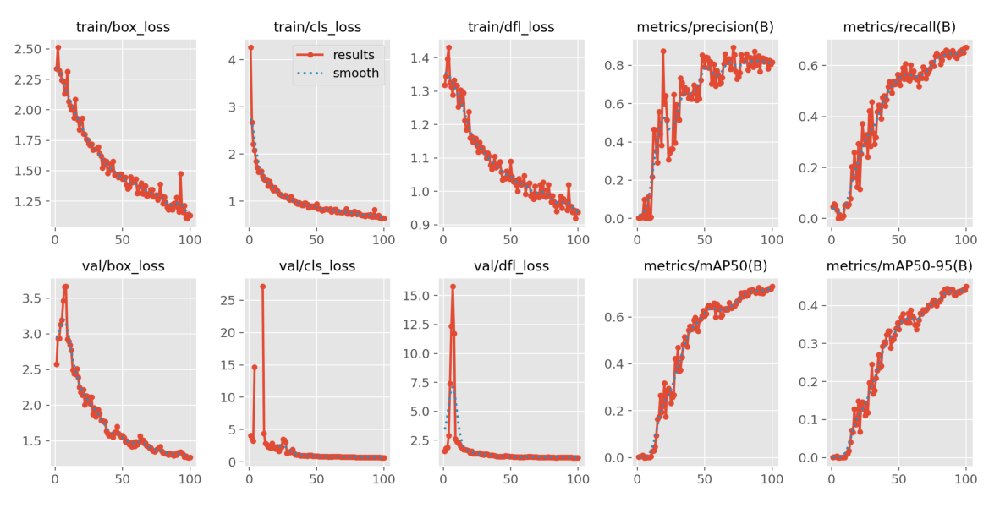

In [29]:
import matplotlib.pyplot as plt
from pathlib import Path

train_loss_file = "/kaggle/working/runs/detect/train/results.png"

img = plt.imread(train_loss_file)
plt.figure(figsize=(15, 10))  
plt.imshow(img)
plt.axis('off') 
plt.show()

In [30]:
import pandas as pd

results_csv_file = "/kaggle/working/runs/detect/train/results.csv"
results_df = pd.read_csv(results_csv_file)

results_df.tail(5) 

,epoch,time,train/box_loss,train/cls_loss,train/dfl_loss,metrics/precision(B),metrics/recall(B),metrics/mAP50(B),metrics/mAP50-95(B),val/box_loss,val/cls_loss,val/dfl_loss,lr/pg0,lr/pg1,lr/pg2
95,96,267.148,1.21476,0.70033,0.93777,0.82059,0.64773,0.71220,0.43823,1.27402,0.69500,1.01259,0.00145,0.00145,0.00145
96,97,269.677,1.11318,0.64078,0.94419,0.78326,0.66057,0.72004,0.43890,1.28464,0.68749,1.01213,0.00136,0.00136,0.00136
97,98,272.269,1.10879,0.63455,0.91900,0.82663,0.65026,0.72246,0.44291,1.26936,0.67422,1.00892,0.00127,0.00127,0.00127
98,99,274.825,1.14146,0.64149,0.94106,0.80547,0.66903,0.72036,0.44057,1.26435,0.68067,1.00736,0.00118,0.00118,0.00118
99,100,277.387,1.13427,0.63449,0.93810,0.81645,0.67153,0.73043,0.45020,1.26800,0.67878,1.01233,0.00109,0.00109,0.00109


# YOLOV8


In [ ]:
from ultralytics import YOLO
import time

model = YOLO("yolov8s.yaml")

data_yaml_path = '/kaggle/working/data.yaml'

start_time = time.time()

results = model.train(
    data=data_yaml_path, 
    epochs=300,        
    imgsz=640,        
    batch=32,         
    lr0=0.01,        
    lrf=0.1,           
    weight_decay=0.0001, 
    augment=True,     
    optimizer='Adam', 
    workers=4,         
    device=0,          
    patience=0        
)

end_time = time.time()
training_time = end_time - start_time
print(f"Eğitim tamamlandı. Toplam süre: {training_time/60:.2f} dakika.")


Ultralytics 8.3.49 🚀 Python-3.10.14 torch-2.4.0 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=yolov8s.yaml, data=/kaggle/working/data.yaml, epochs=300, time=None, patience=0, batch=32, imgsz=640, save=True, save_period=-1, cache=False, device=0, workers=4, project=None, name=train2, exist_ok=False, pretrained=True, optimizer=Adam, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=True, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_boxes=True, li

train: Scanning /kaggle/working/labels/train.cache... 161 images, 0 backgrounds, 0 corrupt: 100%|██████████| 161/161 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))



val: Scanning /kaggle/working/labels/val.cache... 41 images, 0 backgrounds, 0 corrupt: 100%|██████████| 41/41 [00:00<?, ?it/s]


Plotting labels to runs/detect/train2/labels.jpg... 
optimizer: Adam(lr=0.01, momentum=0.937) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0001), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 4 dataloader workers
Logging results to runs/detect/train2
Starting training for 300 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/300      8.42G      5.057      5.513      4.361         99        640: 100%|██████████| 6/6 [00:03<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.10it/s]

                   all         41       1063          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/300      8.41G      4.252      5.288      4.047         26        640: 100%|██████████| 6/6 [00:02<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.91it/s]

                   all         41       1063          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/300      8.57G      4.157      3.711      3.524         29        640: 100%|██████████| 6/6 [00:03<00:00,  1.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.90it/s]

                   all         41       1063   9.76e-05    0.00194   5.74e-05   2.27e-05



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/300      8.03G      3.783      3.372      2.901         14        640: 100%|██████████| 6/6 [00:03<00:00,  1.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.58it/s]

                   all         41       1063   9.76e-05    0.00194   5.74e-05   2.27e-05



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/300       8.1G      3.661      2.856      2.458         95        640: 100%|██████████| 6/6 [00:03<00:00,  1.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.88it/s]

                   all         41       1063   9.54e-05   0.000647   4.87e-05   7.31e-06



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/300      8.09G      3.419      2.584       2.16         93        640: 100%|██████████| 6/6 [00:03<00:00,  1.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/1 [00:00<?, ?it/s]

WARNING ⚠️ NMS time limit 4.050s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:04<00:00,  4.37s/it]

                   all         41       1063   9.54e-05   0.000647   4.87e-05   7.31e-06



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/300      8.52G      3.339      2.509      1.992         27        640: 100%|██████████| 6/6 [00:03<00:00,  1.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:04<00:00,  4.06s/it]

                   all         41       1063   9.54e-05   0.000647   4.87e-05   7.31e-06



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/300      7.95G       3.32      2.571      2.038         24        640: 100%|██████████| 6/6 [00:03<00:00,  1.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.88s/it]

                   all         41       1063   9.54e-05   0.000647   4.87e-05   7.31e-06



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/300      8.17G      3.345      2.319      1.929         84        640: 100%|██████████| 6/6 [00:03<00:00,  1.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:03<00:00,  3.96s/it]

                   all         41       1063   9.54e-05   0.000647   4.87e-05   7.31e-06



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/300      8.45G      3.153      2.316      1.933         20        640: 100%|██████████| 6/6 [00:02<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.26s/it]

                   all         41       1063   9.54e-05   0.000647   4.87e-05   7.31e-06



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/300      8.37G      3.182      2.237      1.864         87        640: 100%|██████████| 6/6 [00:02<00:00,  2.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.38it/s]


                   all         41       1063   9.54e-05   0.000647   4.87e-05   7.31e-06

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/300      8.54G      3.072      2.161      1.833         63        640: 100%|██████████| 6/6 [00:02<00:00,  2.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.82it/s]

                   all         41       1063   9.54e-05   0.000647   4.87e-05   7.31e-06



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/300      8.14G       2.96      2.143      1.863         25        640: 100%|██████████| 6/6 [00:02<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.30it/s]

                   all         41       1063   9.54e-05   0.000647   4.87e-05   7.31e-06



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/300      8.94G      2.849      2.032      1.782         40        640: 100%|██████████| 6/6 [00:02<00:00,  2.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.68it/s]

                   all         41       1063   9.54e-05   0.000647   4.87e-05   7.31e-06



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/300      8.03G      3.053      2.236      1.857         35        640: 100%|██████████| 6/6 [00:02<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.38it/s]

                   all         41       1063    0.00654     0.0269    0.00771    0.00235



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/300      8.77G      3.017      2.214      1.768         18        640: 100%|██████████| 6/6 [00:02<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.69it/s]

                   all         41       1063    0.00526     0.0489    0.00655    0.00161



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/300      8.87G      2.915      2.068       1.71         33        640: 100%|██████████| 6/6 [00:02<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.25it/s]

                   all         41       1063      0.409     0.0158    0.00669    0.00172



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/300      8.27G      2.818      1.998      1.748         58        640: 100%|██████████| 6/6 [00:03<00:00,  1.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.38it/s]

                   all         41       1063        0.1   0.000562     0.0503     0.0251



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/300      8.39G      2.812      2.055      1.754         46        640: 100%|██████████| 6/6 [00:02<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.04it/s]

                   all         41       1063        0.1   0.000562     0.0503     0.0251



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/300      8.41G      2.877      1.929      1.685        109        640: 100%|██████████| 6/6 [00:02<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.34it/s]

                   all         41       1063      0.635     0.0128    0.00947    0.00401



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/300      8.19G      2.721      1.955      1.656         30        640: 100%|██████████| 6/6 [00:02<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.87it/s]

                   all         41       1063      0.531     0.0336     0.0197    0.00575



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/300      8.79G      2.631      1.801      1.589         98        640: 100%|██████████| 6/6 [00:02<00:00,  2.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.10it/s]

                   all         41       1063      0.422      0.123      0.058      0.017



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/300      8.15G      2.659      1.834      1.619         55        640: 100%|██████████| 6/6 [00:02<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.49it/s]

                   all         41       1063      0.495      0.135     0.0752     0.0237



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/300      8.48G       2.58      1.795      1.613         48        640: 100%|██████████| 6/6 [00:02<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.55it/s]

                   all         41       1063      0.491     0.0954     0.0609     0.0183



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/300      8.14G      2.622      1.797       1.62         98        640: 100%|██████████| 6/6 [00:02<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.88it/s]

                   all         41       1063      0.261      0.114     0.0588     0.0191



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/300      9.16G      2.616      1.771      1.602         64        640: 100%|██████████| 6/6 [00:02<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.91it/s]

                   all         41       1063      0.047      0.402      0.123     0.0427



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/300      8.48G      2.618      1.787      1.656        100        640: 100%|██████████| 6/6 [00:02<00:00,  2.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.17it/s]

                   all         41       1063      0.313      0.229      0.147     0.0544



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/300      8.59G      2.517      1.724       1.57         49        640: 100%|██████████| 6/6 [00:02<00:00,  2.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.38it/s]

                   all         41       1063      0.414       0.22       0.15     0.0473



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/300      8.11G      2.495      1.738      1.624         39        640: 100%|██████████| 6/6 [00:02<00:00,  2.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.00it/s]

                   all         41       1063      0.446      0.219      0.128     0.0442



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/300      8.03G      2.562      1.868      1.579         14        640: 100%|██████████| 6/6 [00:02<00:00,  2.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.40it/s]

                   all         41       1063       0.25      0.154      0.134      0.037



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/300      7.98G      2.579      1.809      1.641         16        640: 100%|██████████| 6/6 [00:02<00:00,  2.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.93it/s]

                   all         41       1063      0.677      0.162        0.2      0.069



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/300      8.06G      2.491      1.668      1.526        100        640: 100%|██████████| 6/6 [00:02<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.26it/s]

                   all         41       1063      0.738     0.0888      0.142      0.046



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/300      8.48G      2.456      1.663      1.572         64        640: 100%|██████████| 6/6 [00:03<00:00,  2.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.02it/s]

                   all         41       1063      0.398      0.192      0.195      0.077



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/300      8.94G      2.415       1.66      1.577         53        640: 100%|██████████| 6/6 [00:02<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.06it/s]

                   all         41       1063      0.619      0.229      0.221     0.0856



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/300      8.03G      2.278      1.568      1.501         20        640: 100%|██████████| 6/6 [00:02<00:00,  2.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.66it/s]

                   all         41       1063      0.319      0.318      0.263      0.106



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/300      8.08G      2.342      1.508      1.488         63        640: 100%|██████████| 6/6 [00:02<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.65it/s]

                   all         41       1063      0.475        0.3      0.283     0.0903



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/300      8.14G      2.315      1.604      1.522         48        640: 100%|██████████| 6/6 [00:02<00:00,  2.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.73it/s]

                   all         41       1063       0.48      0.148      0.179     0.0606



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/300      9.01G      2.354      1.567      1.534         24        640: 100%|██████████| 6/6 [00:02<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.63it/s]

                   all         41       1063      0.488      0.238      0.282        0.1



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/300      8.06G      2.252      1.531       1.52         27        640: 100%|██████████| 6/6 [00:02<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.04it/s]

                   all         41       1063      0.325       0.24      0.232     0.0854



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/300      8.11G      2.232      1.497      1.525         22        640: 100%|██████████| 6/6 [00:02<00:00,  2.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.06it/s]

                   all         41       1063      0.543       0.27      0.306      0.112



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/300      8.47G      2.257      1.522      1.516         52        640: 100%|██████████| 6/6 [00:02<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.00it/s]

                   all         41       1063      0.359      0.352      0.296      0.118



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/300      8.76G      2.241      1.569      1.533         24        640: 100%|██████████| 6/6 [00:02<00:00,  2.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.61it/s]

                   all         41       1063      0.456      0.297      0.291      0.128



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/300      8.37G       2.27      1.496      1.448         98        640: 100%|██████████| 6/6 [00:02<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.62it/s]

                   all         41       1063       0.56      0.306      0.341      0.146



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/300      8.51G      2.124      1.454      1.414         20        640: 100%|██████████| 6/6 [00:02<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.73it/s]

                   all         41       1063      0.485      0.323      0.323      0.122



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/300      8.49G      2.116      1.436      1.421         58        640: 100%|██████████| 6/6 [00:02<00:00,  2.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.62it/s]

                   all         41       1063      0.628      0.252      0.304      0.127



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/300      8.91G      2.188      1.528      1.449         20        640: 100%|██████████| 6/6 [00:02<00:00,  2.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.66it/s]

                   all         41       1063      0.432      0.347      0.374      0.149



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/300      8.48G      2.151      1.488      1.477         13        640: 100%|██████████| 6/6 [00:02<00:00,  2.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.65it/s]

                   all         41       1063      0.613      0.289      0.308      0.133



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/300      8.07G      2.193      1.489      1.437         40        640: 100%|██████████| 6/6 [00:03<00:00,  2.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.98it/s]

                   all         41       1063      0.537      0.331      0.358      0.154



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/300      7.96G      2.195      1.423      1.425         83        640: 100%|██████████| 6/6 [00:02<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.70it/s]

                   all         41       1063      0.558      0.374      0.391      0.182



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/300      8.63G      2.119      1.474      1.492         23        640: 100%|██████████| 6/6 [00:02<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.70it/s]

                   all         41       1063      0.509      0.407      0.347      0.156



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/300      8.41G       2.11      1.382      1.453         32        640: 100%|██████████| 6/6 [00:02<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.66it/s]

                   all         41       1063      0.338      0.367      0.335      0.142



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/300      8.57G      2.105      1.369      1.375         24        640: 100%|██████████| 6/6 [00:02<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.06it/s]

                   all         41       1063      0.567      0.356       0.36      0.165



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/300      8.49G      2.104      1.383       1.44         31        640: 100%|██████████| 6/6 [00:02<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.65it/s]

                   all         41       1063      0.688      0.359      0.417       0.19



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/300       8.6G      2.064       1.33      1.434         36        640: 100%|██████████| 6/6 [00:02<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.62it/s]

                   all         41       1063       0.55      0.405      0.391      0.164



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/300      8.97G      2.059      1.331      1.367         42        640: 100%|██████████| 6/6 [00:02<00:00,  2.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.91it/s]

                   all         41       1063      0.506      0.385      0.403      0.183



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/300      8.06G       2.14       1.34      1.388         23        640: 100%|██████████| 6/6 [00:03<00:00,  1.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.63it/s]

                   all         41       1063        0.4      0.354       0.36      0.159



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/300      8.87G      1.964      1.336      1.369         38        640: 100%|██████████| 6/6 [00:02<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.10it/s]

                   all         41       1063       0.65      0.289       0.35      0.151



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/300      8.12G      2.109      1.335      1.387         88        640: 100%|██████████| 6/6 [00:02<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.65it/s]

                   all         41       1063      0.629      0.364      0.378      0.181



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/300      8.11G      2.091      1.322      1.372         64        640: 100%|██████████| 6/6 [00:03<00:00,  1.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.69it/s]

                   all         41       1063      0.597      0.377      0.419      0.201



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/300      8.69G      2.073      1.302      1.423         32        640: 100%|██████████| 6/6 [00:02<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.69it/s]

                   all         41       1063      0.454      0.364      0.379      0.176



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/300      8.66G      1.972      1.244      1.342         34        640: 100%|██████████| 6/6 [00:02<00:00,  2.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.65it/s]

                   all         41       1063      0.547      0.353      0.394      0.185



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/300      8.84G      1.956      1.296      1.402         47        640: 100%|██████████| 6/6 [00:02<00:00,  2.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.68it/s]

                   all         41       1063      0.497      0.408       0.43      0.212



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/300      8.41G      2.027      1.289      1.415         27        640: 100%|██████████| 6/6 [00:02<00:00,  2.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.72it/s]

                   all         41       1063      0.558      0.423       0.44      0.214



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/300      8.85G      2.005      1.271      1.343         51        640: 100%|██████████| 6/6 [00:02<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.75it/s]

                   all         41       1063      0.594      0.391      0.413       0.21



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/300      8.51G      1.942      1.234      1.323         44        640: 100%|██████████| 6/6 [00:02<00:00,  2.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.99it/s]

                   all         41       1063      0.431      0.321      0.343      0.176



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/300      8.52G       1.95       1.22      1.302         91        640: 100%|██████████| 6/6 [00:02<00:00,  2.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.36it/s]

                   all         41       1063      0.615      0.381      0.407      0.204



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/300      8.18G      1.938      1.187      1.295         27        640: 100%|██████████| 6/6 [00:02<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.13it/s]

                   all         41       1063      0.438      0.395      0.399      0.197



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/300      8.14G      1.952      1.259      1.374         16        640: 100%|██████████| 6/6 [00:02<00:00,  2.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.02it/s]

                   all         41       1063      0.594      0.331      0.385      0.182



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/300      8.06G      1.871      1.164       1.31         59        640: 100%|██████████| 6/6 [00:02<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.10it/s]

                   all         41       1063      0.612      0.383      0.486      0.249



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/300       7.9G      1.852       1.21       1.32         23        640: 100%|██████████| 6/6 [00:02<00:00,  2.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.14it/s]

                   all         41       1063      0.576      0.464      0.517      0.245



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/300      8.35G       1.88      1.179      1.271         64        640: 100%|██████████| 6/6 [00:02<00:00,  2.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.04it/s]

                   all         41       1063      0.647      0.473      0.518      0.254



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/300      8.46G      1.942      1.267      1.402         16        640: 100%|██████████| 6/6 [00:02<00:00,  2.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.08it/s]

                   all         41       1063      0.624      0.468      0.503      0.232



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/300      8.53G      1.883      1.171      1.316         26        640: 100%|██████████| 6/6 [00:02<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.12it/s]

                   all         41       1063      0.761      0.395      0.489       0.23



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/300      8.06G      1.863      1.158      1.356         29        640: 100%|██████████| 6/6 [00:02<00:00,  2.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.67it/s]

                   all         41       1063      0.572      0.448      0.465       0.22



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/300      8.47G      1.835      1.139      1.284         21        640: 100%|██████████| 6/6 [00:02<00:00,  2.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.57it/s]

                   all         41       1063      0.624        0.4      0.478      0.231



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/300      8.07G      1.861      1.146      1.299         58        640: 100%|██████████| 6/6 [00:02<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.65it/s]

                   all         41       1063      0.697      0.429      0.501      0.247



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/300      8.59G      1.871      1.191      1.328         51        640: 100%|██████████| 6/6 [00:02<00:00,  2.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.06it/s]

                   all         41       1063      0.723      0.465      0.533      0.262



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/300      8.51G      1.886       1.15        1.3         53        640: 100%|██████████| 6/6 [00:02<00:00,  2.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.66it/s]

                   all         41       1063      0.634      0.516      0.535      0.267



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/300      8.56G      1.772      1.147      1.297         26        640: 100%|██████████| 6/6 [00:03<00:00,  2.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.10it/s]

                   all         41       1063      0.698      0.431      0.505      0.259



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/300      8.92G      1.768      1.088      1.276         66        640: 100%|██████████| 6/6 [00:02<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.68it/s]

                   all         41       1063      0.722       0.44      0.525      0.253



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/300      8.03G      1.775      1.135      1.283         25        640: 100%|██████████| 6/6 [00:02<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.01it/s]

                   all         41       1063      0.647      0.462      0.498      0.258



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/300      8.52G      1.807      1.131      1.269         58        640: 100%|██████████| 6/6 [00:02<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.68it/s]

                   all         41       1063      0.682      0.432      0.499      0.254



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/300      8.49G       1.72      1.067      1.236         59        640: 100%|██████████| 6/6 [00:02<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.66it/s]

                   all         41       1063      0.734      0.448      0.531      0.282



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/300      8.03G      1.691      1.047      1.217         35        640: 100%|██████████| 6/6 [00:02<00:00,  2.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.04it/s]

                   all         41       1063      0.741      0.457      0.533       0.29



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/300      8.02G      1.739      1.053       1.25         34        640: 100%|██████████| 6/6 [00:02<00:00,  2.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.68it/s]

                   all         41       1063       0.55      0.454      0.496      0.256



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/300      9.04G      1.698      1.041      1.225         26        640: 100%|██████████| 6/6 [00:02<00:00,  2.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.75it/s]

                   all         41       1063       0.65      0.445      0.511       0.25



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/300      8.92G      1.734      1.059      1.306         16        640: 100%|██████████| 6/6 [00:02<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.69it/s]

                   all         41       1063       0.72      0.417      0.477      0.235



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/300      8.58G      1.774      1.078      1.241         54        640: 100%|██████████| 6/6 [00:02<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.01it/s]

                   all         41       1063      0.636      0.471      0.511      0.245



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/300      8.22G      1.789      1.085      1.287         31        640: 100%|██████████| 6/6 [00:02<00:00,  2.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.71it/s]

                   all         41       1063      0.701      0.511      0.553      0.264



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/300      8.51G      1.816      1.062      1.246        101        640: 100%|██████████| 6/6 [00:02<00:00,  2.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.03it/s]

                   all         41       1063      0.565      0.472      0.516      0.269



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/300      8.41G      1.795      1.099      1.274         45        640: 100%|██████████| 6/6 [00:02<00:00,  2.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.99it/s]

                   all         41       1063      0.768      0.417      0.507      0.256



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/300      8.86G      1.724      1.069      1.276         49        640: 100%|██████████| 6/6 [00:02<00:00,  2.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.67it/s]

                   all         41       1063      0.746      0.438      0.524      0.274



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/300       8.4G      1.765      1.101      1.241         19        640: 100%|██████████| 6/6 [00:02<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.60it/s]

                   all         41       1063      0.598      0.485      0.496      0.237



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/300      8.86G      1.726      1.049      1.262         21        640: 100%|██████████| 6/6 [00:02<00:00,  2.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.97it/s]

                   all         41       1063      0.668      0.489      0.539      0.256



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/300      8.57G      1.708      1.044      1.251         40        640: 100%|██████████| 6/6 [00:02<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.70it/s]

                   all         41       1063      0.652      0.526      0.557      0.293



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/300       8.6G       1.74       1.07      1.245         28        640: 100%|██████████| 6/6 [00:02<00:00,  2.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.54it/s]

                   all         41       1063      0.741      0.436      0.509      0.285



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/300      8.46G      1.725      1.014      1.234         33        640: 100%|██████████| 6/6 [00:02<00:00,  2.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.78it/s]

                   all         41       1063       0.62       0.49      0.536      0.235



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/300      8.77G      1.709      1.006      1.211         70        640: 100%|██████████| 6/6 [00:02<00:00,  2.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.70it/s]

                   all         41       1063      0.737      0.504       0.56      0.284



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/300      8.11G      1.692      0.995      1.248         50        640: 100%|██████████| 6/6 [00:02<00:00,  2.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.04it/s]

                   all         41       1063      0.756      0.507      0.559      0.296



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/300       8.1G       1.64     0.9897       1.22         47        640: 100%|██████████| 6/6 [00:02<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.65it/s]

                   all         41       1063      0.693      0.538      0.554      0.298



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    101/300      8.58G      1.632      1.008      1.175         19        640: 100%|██████████| 6/6 [00:02<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.72it/s]

                   all         41       1063      0.714      0.502      0.564      0.301



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    102/300      8.49G      1.798      1.234      1.325         17        640: 100%|██████████| 6/6 [00:03<00:00,  1.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.01it/s]

                   all         41       1063      0.734      0.499      0.567      0.308



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    103/300      8.08G      1.645     0.9801      1.227         27        640: 100%|██████████| 6/6 [00:02<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.56it/s]

                   all         41       1063      0.776      0.473      0.538      0.293



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    104/300      7.97G      1.692      1.049      1.235         24        640: 100%|██████████| 6/6 [00:02<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.70it/s]

                   all         41       1063      0.811      0.481       0.58      0.311



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    105/300      8.34G      1.577     0.9329       1.18         30        640: 100%|██████████| 6/6 [00:02<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.64it/s]

                   all         41       1063      0.736      0.511      0.578      0.314



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    106/300      8.47G      1.623     0.9594      1.186         55        640: 100%|██████████| 6/6 [00:02<00:00,  2.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.72it/s]

                   all         41       1063      0.738      0.526      0.595      0.306



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    107/300      8.04G      1.619     0.9432      1.191         42        640: 100%|██████████| 6/6 [00:02<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.04it/s]

                   all         41       1063      0.766      0.539      0.617       0.33



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    108/300      8.19G      1.661      1.011      1.232         24        640: 100%|██████████| 6/6 [00:02<00:00,  2.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.67it/s]

                   all         41       1063      0.765      0.524      0.621      0.319



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    109/300      8.08G      1.633     0.9478      1.186        107        640: 100%|██████████| 6/6 [00:02<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.13it/s]

                   all         41       1063      0.639      0.575      0.594      0.315



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    110/300      8.52G        1.6     0.9643      1.203         62        640: 100%|██████████| 6/6 [00:02<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.97it/s]

                   all         41       1063      0.671      0.555      0.595      0.327



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    111/300      8.47G      1.604     0.9927      1.234         42        640: 100%|██████████| 6/6 [00:02<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.69it/s]

                   all         41       1063       0.71      0.553      0.612      0.327



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    112/300      8.11G      1.592     0.9275      1.161         97        640: 100%|██████████| 6/6 [00:02<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.94it/s]

                   all         41       1063      0.825       0.48        0.6      0.328



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    113/300      8.99G        1.6     0.9601      1.254         20        640: 100%|██████████| 6/6 [00:02<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.75it/s]

                   all         41       1063      0.769      0.545      0.613      0.345



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    114/300      8.34G      1.609     0.9355      1.218         32        640: 100%|██████████| 6/6 [00:02<00:00,  2.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.67it/s]

                   all         41       1063      0.734      0.548      0.603      0.335



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    115/300      8.08G      1.521     0.9095      1.169         53        640: 100%|██████████| 6/6 [00:02<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.10it/s]

                   all         41       1063      0.686      0.509      0.579      0.314



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    116/300      8.46G      1.928      1.152      1.558         20        640: 100%|██████████| 6/6 [00:02<00:00,  2.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.18it/s]

                   all         41       1063      0.791      0.546      0.614      0.318



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    117/300       8.3G      1.541      0.911      1.146         12        640: 100%|██████████| 6/6 [00:02<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.16it/s]

                   all         41       1063       0.76      0.571      0.627      0.335



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    118/300      8.54G      1.569     0.9419      1.187         19        640: 100%|██████████| 6/6 [00:02<00:00,  2.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.04it/s]

                   all         41       1063      0.741      0.526      0.614      0.313



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    119/300      8.08G      1.588     0.9107      1.152         78        640: 100%|██████████| 6/6 [00:02<00:00,  2.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.07it/s]

                   all         41       1063      0.717      0.559      0.618      0.331



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    120/300      8.33G       1.52     0.8927      1.151         28        640: 100%|██████████| 6/6 [00:02<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.00it/s]

                   all         41       1063      0.807      0.548      0.653      0.346



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    121/300      8.64G      1.536     0.9048      1.153         28        640: 100%|██████████| 6/6 [00:02<00:00,  2.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.87it/s]

                   all         41       1063      0.773      0.529      0.637      0.334



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    122/300      8.49G      1.501     0.8867       1.15         29        640: 100%|██████████| 6/6 [00:02<00:00,  2.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.74it/s]

                   all         41       1063      0.714      0.589       0.64      0.345



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    123/300      8.04G      1.516     0.9032      1.129         21        640: 100%|██████████| 6/6 [00:02<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.12it/s]

                   all         41       1063      0.773      0.546      0.636       0.33



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    124/300      8.43G      1.602     0.9555      1.175         88        640: 100%|██████████| 6/6 [00:02<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.73it/s]

                   all         41       1063      0.694      0.577      0.624      0.347



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    125/300      8.49G      1.597     0.9594       1.21         16        640: 100%|██████████| 6/6 [00:02<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.76it/s]

                   all         41       1063      0.776      0.566      0.646      0.347



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    126/300      8.44G      1.528       0.89      1.152         55        640: 100%|██████████| 6/6 [00:02<00:00,  2.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.18it/s]

                   all         41       1063      0.799       0.54      0.628      0.338



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    127/300      8.58G      1.486     0.8748      1.106         23        640: 100%|██████████| 6/6 [00:02<00:00,  2.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.15it/s]

                   all         41       1063      0.768      0.553      0.625      0.335



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    128/300      8.03G      1.471     0.8539      1.149         31        640: 100%|██████████| 6/6 [00:02<00:00,  2.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.13it/s]

                   all         41       1063      0.751      0.557       0.64      0.342



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    129/300      8.51G      1.504     0.8599      1.149         46        640: 100%|██████████| 6/6 [00:02<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.11it/s]

                   all         41       1063      0.745      0.605      0.657       0.36



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    130/300      8.15G      1.495     0.8654      1.151         18        640: 100%|██████████| 6/6 [00:02<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.14it/s]

                   all         41       1063      0.736      0.561      0.646      0.343



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    131/300      8.49G      1.566     0.9651      1.192         22        640: 100%|██████████| 6/6 [00:02<00:00,  2.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.74it/s]

                   all         41       1063       0.67      0.625      0.645      0.333



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    132/300      8.03G      1.559     0.8994       1.18         52        640: 100%|██████████| 6/6 [00:02<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.12it/s]

                   all         41       1063      0.763      0.562      0.636       0.33



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    133/300      8.05G      1.562     0.9294      1.188         19        640: 100%|██████████| 6/6 [00:02<00:00,  2.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.14it/s]

                   all         41       1063      0.786      0.549      0.645      0.359



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    134/300      8.01G      1.521     0.9017      1.207         32        640: 100%|██████████| 6/6 [00:02<00:00,  2.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.04it/s]

                   all         41       1063       0.73       0.56      0.625      0.363



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    135/300       8.1G      1.532     0.8686      1.137         58        640: 100%|██████████| 6/6 [00:02<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.10it/s]

                   all         41       1063      0.712      0.552      0.623      0.357



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    136/300      8.08G      1.572     0.8462      1.139         70        640: 100%|██████████| 6/6 [00:02<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.03it/s]

                   all         41       1063      0.695      0.575      0.633      0.339



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    137/300      8.16G       1.49     0.8529       1.12         19        640: 100%|██████████| 6/6 [00:02<00:00,  2.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.76it/s]

                   all         41       1063      0.711      0.549      0.634      0.348



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    138/300         8G      1.501     0.8745      1.162         23        640: 100%|██████████| 6/6 [00:02<00:00,  2.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.11it/s]

                   all         41       1063       0.74      0.571      0.651      0.364



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    139/300      8.08G      1.477     0.8227      1.108         51        640: 100%|██████████| 6/6 [00:02<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.75it/s]

                   all         41       1063      0.734      0.604       0.65       0.36



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    140/300      8.42G      1.455     0.8264      1.127         62        640: 100%|██████████| 6/6 [00:03<00:00,  1.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.87it/s]

                   all         41       1063      0.817       0.57      0.658      0.367



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    141/300      8.46G      1.471     0.8506       1.18         37        640: 100%|██████████| 6/6 [00:02<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.18it/s]

                   all         41       1063      0.765      0.582      0.649      0.341



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    142/300      8.51G       1.44     0.8444      1.112         20        640: 100%|██████████| 6/6 [00:02<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.00it/s]

                   all         41       1063      0.789      0.578      0.669      0.369



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    143/300      8.45G      1.437     0.8127      1.111         59        640: 100%|██████████| 6/6 [00:02<00:00,  2.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.11it/s]

                   all         41       1063       0.79      0.569      0.676      0.369



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    144/300      8.31G      1.435     0.8447       1.15         36        640: 100%|██████████| 6/6 [00:02<00:00,  2.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.07it/s]

                   all         41       1063      0.742      0.618      0.675      0.376



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    145/300      8.15G       1.41     0.8105      1.126         31        640: 100%|██████████| 6/6 [00:02<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.11it/s]

                   all         41       1063      0.789      0.554      0.643      0.349



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    146/300      8.82G      1.506     0.8648      1.157         51        640: 100%|██████████| 6/6 [00:02<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.71it/s]

                   all         41       1063      0.724      0.618       0.69      0.362



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    147/300      7.94G      1.482     0.8481      1.283         14        640: 100%|██████████| 6/6 [00:02<00:00,  2.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.14it/s]

                   all         41       1063      0.785      0.561      0.662       0.37



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    148/300      8.11G      1.523     0.8645      1.161         43        640: 100%|██████████| 6/6 [00:03<00:00,  2.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.64it/s]

                   all         41       1063      0.773      0.601      0.668      0.362



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    149/300      8.47G      1.443     0.8393      1.113         42        640: 100%|██████████| 6/6 [00:02<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.05it/s]

                   all         41       1063      0.786      0.582      0.671      0.375



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    150/300      8.86G      1.387     0.7849      1.086         62        640: 100%|██████████| 6/6 [00:02<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.76it/s]

                   all         41       1063      0.776      0.618      0.684      0.381



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    151/300      8.53G       1.46     0.8465      1.193         14        640: 100%|██████████| 6/6 [00:02<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.14it/s]

                   all         41       1063       0.76      0.589      0.664      0.365



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    152/300      8.21G      1.393     0.7991      1.098         38        640: 100%|██████████| 6/6 [00:02<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.08it/s]

                   all         41       1063      0.794      0.585      0.661      0.387



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    153/300      9.01G      1.502     0.8216      1.083        113        640: 100%|██████████| 6/6 [00:02<00:00,  2.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.71it/s]

                   all         41       1063      0.808        0.6      0.662      0.377



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    154/300      8.42G      1.479     0.8175        1.1        106        640: 100%|██████████| 6/6 [00:02<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.05it/s]

                   all         41       1063      0.788      0.559      0.673      0.367



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    155/300      8.72G      1.401     0.8117      1.093         46        640: 100%|██████████| 6/6 [00:02<00:00,  2.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.45it/s]

                   all         41       1063      0.761      0.585      0.667      0.387



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    156/300       8.5G      1.475     0.8187      1.166         52        640: 100%|██████████| 6/6 [00:02<00:00,  2.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.10it/s]

                   all         41       1063      0.726      0.645      0.667      0.364



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    157/300      8.62G      1.343     0.7925      1.104         49        640: 100%|██████████| 6/6 [00:02<00:00,  2.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.13it/s]

                   all         41       1063      0.743      0.641      0.696      0.376



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    158/300      8.56G      1.359     0.7841      1.158         15        640: 100%|██████████| 6/6 [00:02<00:00,  2.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.13it/s]

                   all         41       1063      0.758      0.656      0.693      0.391



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    159/300      7.94G      1.359     0.7683      1.093         16        640: 100%|██████████| 6/6 [00:02<00:00,  2.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.72it/s]

                   all         41       1063      0.833      0.592      0.687      0.389



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    160/300      8.47G      1.369     0.7806      1.075         86        640: 100%|██████████| 6/6 [00:02<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.09it/s]

                   all         41       1063      0.747      0.626      0.677      0.386



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    161/300      8.18G      1.336     0.7913      1.059         18        640: 100%|██████████| 6/6 [00:02<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.55it/s]

                   all         41       1063      0.805        0.6      0.701      0.389



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    162/300      8.59G      1.416     0.7852      1.077        104        640: 100%|██████████| 6/6 [00:02<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.75it/s]

                   all         41       1063      0.696       0.62      0.672      0.384



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    163/300      8.18G      1.375     0.7809      1.064         20        640: 100%|██████████| 6/6 [00:02<00:00,  2.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.12it/s]

                   all         41       1063      0.838      0.584      0.712      0.383



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    164/300      8.52G      1.364     0.7467      1.054         91        640: 100%|██████████| 6/6 [00:02<00:00,  2.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.72it/s]

                   all         41       1063      0.828      0.594      0.694      0.396



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    165/300      8.08G      1.334     0.7644      1.082         14        640: 100%|██████████| 6/6 [00:02<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.73it/s]

                   all         41       1063      0.764       0.62      0.682      0.396



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    166/300      8.07G      1.343     0.7453       1.07         47        640: 100%|██████████| 6/6 [00:02<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.70it/s]

                   all         41       1063      0.756      0.598      0.681      0.385



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    167/300      8.04G      1.354     0.7554      1.082         46        640: 100%|██████████| 6/6 [00:02<00:00,  2.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.76it/s]

                   all         41       1063      0.829        0.6        0.7      0.395



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    168/300      8.08G      1.393     0.8403      1.167         18        640: 100%|██████████| 6/6 [00:02<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.12it/s]

                   all         41       1063      0.797      0.625      0.698      0.393



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    169/300       8.1G      1.457     0.7938      1.061         86        640: 100%|██████████| 6/6 [00:02<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.75it/s]

                   all         41       1063      0.776      0.622      0.699      0.385



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    170/300      8.06G      1.337     0.7609      1.108         27        640: 100%|██████████| 6/6 [00:02<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.08it/s]

                   all         41       1063      0.767      0.624      0.711      0.399



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    171/300      8.35G      1.321     0.7543        1.1         54        640: 100%|██████████| 6/6 [00:03<00:00,  2.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.03it/s]

                   all         41       1063      0.768      0.658      0.722      0.407



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    172/300      8.51G      1.437        0.8       1.07         91        640: 100%|██████████| 6/6 [00:02<00:00,  2.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.68it/s]

                   all         41       1063      0.811      0.636      0.709      0.407



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    173/300      7.91G      1.338     0.7745      1.135         18        640: 100%|██████████| 6/6 [00:02<00:00,  2.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.65it/s]

                   all         41       1063      0.839        0.6      0.701      0.408



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    174/300      8.43G      1.326     0.7582       1.08         55        640: 100%|██████████| 6/6 [00:02<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.80it/s]

                   all         41       1063      0.837      0.631      0.721      0.421



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    175/300      8.44G      1.334      0.759      1.079         58        640: 100%|██████████| 6/6 [00:02<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.11it/s]

                   all         41       1063      0.858      0.638      0.725      0.415



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    176/300      8.37G      1.295     0.7343      1.072         46        640: 100%|██████████| 6/6 [00:02<00:00,  2.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.12it/s]

                   all         41       1063      0.831      0.617      0.707      0.387



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    177/300      8.15G      1.339     0.7587      1.081         29        640: 100%|██████████| 6/6 [00:02<00:00,  2.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.11it/s]

                   all         41       1063      0.803      0.636      0.706      0.404



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    178/300       8.1G      1.331     0.7623      1.082         48        640: 100%|██████████| 6/6 [00:02<00:00,  2.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.97it/s]

                   all         41       1063        0.7      0.676      0.698        0.4



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    179/300      8.49G      1.409     0.7917      1.076         23        640: 100%|██████████| 6/6 [00:02<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.69it/s]

                   all         41       1063      0.814      0.617      0.717      0.383



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    180/300      8.53G      1.335     0.7674      1.081         31        640: 100%|██████████| 6/6 [00:02<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.77it/s]

                   all         41       1063      0.785      0.624       0.73      0.404



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    181/300      8.42G      1.281     0.7173      1.061         19        640: 100%|██████████| 6/6 [00:02<00:00,  2.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.20it/s]

                   all         41       1063      0.831      0.633      0.736      0.398



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    182/300      8.64G       1.32     0.7312      1.053         27        640: 100%|██████████| 6/6 [00:02<00:00,  2.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.73it/s]

                   all         41       1063      0.867      0.598      0.732      0.407



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    183/300      8.52G      1.341     0.7476      1.045         67        640: 100%|██████████| 6/6 [00:02<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.02it/s]

                   all         41       1063      0.787       0.64      0.716      0.417



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    184/300      8.54G      1.385     0.7642      1.082         48        640: 100%|██████████| 6/6 [00:02<00:00,  2.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.08it/s]

                   all         41       1063      0.799      0.652      0.713      0.406



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    185/300       8.2G      1.339     0.7287       1.06         68        640: 100%|██████████| 6/6 [00:02<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.71it/s]

                   all         41       1063      0.772      0.667      0.722      0.409



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    186/300      8.08G      1.378     0.7325      1.036         98        640: 100%|██████████| 6/6 [00:03<00:00,  1.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.79it/s]

                   all         41       1063      0.774      0.705      0.738      0.414



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    187/300      8.07G      1.403      0.751      1.058         79        640: 100%|██████████| 6/6 [00:02<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.70it/s]

                   all         41       1063       0.77       0.67      0.736      0.417



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    188/300      8.43G      1.314     0.7344      1.046         49        640: 100%|██████████| 6/6 [00:02<00:00,  2.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.69it/s]

                   all         41       1063      0.819      0.646      0.725        0.4



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    189/300       8.4G      1.302     0.7457      1.059         47        640: 100%|██████████| 6/6 [00:02<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.79it/s]

                   all         41       1063      0.798      0.641      0.725      0.404



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    190/300      8.38G      1.317     0.7185      1.034        100        640: 100%|██████████| 6/6 [00:02<00:00,  2.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.19it/s]

                   all         41       1063       0.83      0.678      0.737      0.419



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    191/300      8.15G      1.323     0.7232      1.058         64        640: 100%|██████████| 6/6 [00:02<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.79it/s]

                   all         41       1063      0.815      0.657      0.721      0.426



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    192/300      8.91G      1.316      0.722      1.065         61        640: 100%|██████████| 6/6 [00:02<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.07it/s]

                   all         41       1063      0.815      0.641      0.728      0.429



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    193/300      8.08G      1.371     0.7395      1.033        107        640: 100%|██████████| 6/6 [00:02<00:00,  2.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.74it/s]

                   all         41       1063      0.755      0.717      0.739      0.426



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    194/300      8.42G      1.259     0.7367      1.055         21        640: 100%|██████████| 6/6 [00:02<00:00,  2.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.09it/s]

                   all         41       1063      0.808      0.671      0.729      0.414



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    195/300      8.23G      1.301      0.737      1.077         24        640: 100%|██████████| 6/6 [00:02<00:00,  2.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.70it/s]

                   all         41       1063      0.804      0.669      0.734      0.433



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    196/300      8.15G      1.237     0.6889      1.025         77        640: 100%|██████████| 6/6 [00:02<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.26it/s]

                   all         41       1063       0.81      0.674      0.734      0.422



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    197/300      8.27G      1.253     0.6934      1.053         61        640: 100%|██████████| 6/6 [00:02<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.14it/s]

                   all         41       1063      0.851      0.674      0.742      0.438



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    198/300      8.58G       1.31     0.7324      1.033         70        640: 100%|██████████| 6/6 [00:02<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.10it/s]

                   all         41       1063      0.854      0.643      0.719      0.435



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    199/300      8.42G      1.283     0.7196      1.041         33        640: 100%|██████████| 6/6 [00:02<00:00,  2.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.16it/s]

                   all         41       1063       0.83      0.663      0.731      0.434



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    200/300      8.16G      1.266     0.7304      1.043         14        640: 100%|██████████| 6/6 [00:02<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.72it/s]

                   all         41       1063      0.825      0.645      0.728      0.431



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    201/300       8.6G      1.287     0.6996      1.019         57        640: 100%|██████████| 6/6 [00:02<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.07it/s]

                   all         41       1063      0.804      0.635      0.727      0.426



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    202/300      8.46G      1.267     0.7095      1.039         67        640: 100%|██████████| 6/6 [00:02<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.74it/s]

                   all         41       1063      0.833      0.661      0.733      0.431



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    203/300      8.05G      1.314     0.7148      1.106         45        640: 100%|██████████| 6/6 [00:02<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.70it/s]

                   all         41       1063      0.811      0.679      0.749      0.442



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    204/300      7.96G      1.248     0.7116      1.052         17        640: 100%|██████████| 6/6 [00:02<00:00,  2.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.99it/s]

                   all         41       1063      0.785      0.694      0.733      0.432



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    205/300      8.03G      1.251     0.6951      1.032         64        640: 100%|██████████| 6/6 [00:02<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.14it/s]

                   all         41       1063      0.871      0.638      0.741       0.43



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    206/300      8.55G      1.373     0.7322       1.03         85        640: 100%|██████████| 6/6 [00:02<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.15it/s]

                   all         41       1063      0.774      0.689      0.745      0.423



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    207/300      8.42G      1.251     0.6791      1.046         22        640: 100%|██████████| 6/6 [00:02<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.73it/s]

                   all         41       1063      0.844      0.643      0.738      0.426



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    208/300      8.15G      1.251     0.7134      1.067         30        640: 100%|██████████| 6/6 [00:02<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.77it/s]

                   all         41       1063      0.859      0.634       0.72      0.407



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    209/300      7.96G      1.295     0.7082      1.055         50        640: 100%|██████████| 6/6 [00:03<00:00,  1.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.20it/s]

                   all         41       1063      0.871      0.679      0.769      0.451



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    210/300      8.05G      1.262     0.6889      1.008         29        640: 100%|██████████| 6/6 [00:02<00:00,  2.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.14it/s]

                   all         41       1063      0.824      0.656      0.749      0.451



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    211/300      8.08G       1.27     0.7103      1.059         49        640: 100%|██████████| 6/6 [00:02<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.78it/s]

                   all         41       1063      0.795      0.707       0.76      0.457



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    212/300      8.42G      1.247     0.6784      1.037         39        640: 100%|██████████| 6/6 [00:02<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.77it/s]

                   all         41       1063      0.796      0.734      0.773      0.459



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    213/300      8.46G      1.492     0.8072      1.084         70        640: 100%|██████████| 6/6 [00:02<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.23it/s]

                   all         41       1063      0.847      0.671      0.762      0.441



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    214/300      8.39G       1.28     0.6951      1.033         45        640: 100%|██████████| 6/6 [00:02<00:00,  2.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.85it/s]

                   all         41       1063       0.86      0.662       0.75      0.445



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    215/300      8.04G      1.337     0.7253      1.139         14        640: 100%|██████████| 6/6 [00:02<00:00,  2.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.18it/s]

                   all         41       1063      0.862      0.675      0.764      0.452



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    216/300      8.87G       1.27     0.6903       1.03         86        640: 100%|██████████| 6/6 [00:02<00:00,  2.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.23it/s]

                   all         41       1063      0.853      0.676      0.766      0.446



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    217/300      8.51G      1.257     0.6959      1.069         32        640: 100%|██████████| 6/6 [00:02<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.81it/s]

                   all         41       1063      0.885      0.674      0.762      0.436



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    218/300      8.46G      1.359     0.7252       1.05         95        640: 100%|██████████| 6/6 [00:02<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.15it/s]

                   all         41       1063      0.881      0.658      0.765      0.452



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    219/300      8.51G      1.228     0.7588      1.052         16        640: 100%|██████████| 6/6 [00:02<00:00,  2.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.36it/s]

                   all         41       1063       0.85      0.689       0.77      0.458



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    220/300      9.03G      1.173     0.6576      1.019         54        640: 100%|██████████| 6/6 [00:02<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.16it/s]

                   all         41       1063      0.858      0.642      0.758      0.441



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    221/300      7.96G      1.187     0.6483      1.008         57        640: 100%|██████████| 6/6 [00:02<00:00,  2.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.19it/s]

                   all         41       1063      0.882      0.664      0.775      0.458



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    222/300      8.43G       1.23     0.6716      1.009         89        640: 100%|██████████| 6/6 [00:02<00:00,  2.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.21it/s]

                   all         41       1063      0.801      0.674      0.756       0.44



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    223/300      7.96G      1.262     0.6799      1.039         73        640: 100%|██████████| 6/6 [00:02<00:00,  2.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.52it/s]

                   all         41       1063      0.852      0.686      0.772      0.456



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    224/300      8.36G      1.194     0.6511       1.01         43        640: 100%|██████████| 6/6 [00:02<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.62it/s]

                   all         41       1063      0.838      0.697      0.771      0.453



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    225/300      8.03G      1.251     0.6945       1.04         50        640: 100%|██████████| 6/6 [00:02<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.14it/s]

                   all         41       1063      0.878      0.666      0.765      0.446



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    226/300      8.03G      1.183     0.6625      1.017       1530        640:  50%|█████     | 3/6 [00:01<00:01,  1.75it/s]

In [ ]:
if model.model is not None:
    torch.save(model.model.state_dict(), "yolov8n_model.pt")
    print("Model başarıyla kaydedildi.")
else:
    print("Model eğitimi başarısız oldu, kaydedilemiyor.")


In [ ]:
p='caea93784eeec577cc5df12c0cfa1523c92e980f'

In [ ]:
import matplotlib.pyplot as plt
from pathlib import Path

train_loss_file = "/kaggle/working/runs/detect/train2/results.png"

img = plt.imread(train_loss_file)
plt.figure(figsize=(15, 10))  
plt.imshow(img)
plt.axis('off') 
plt.show()

In [ ]:
import pandas as pd

results_csv_file = "/kaggle/working/runs/detect/train2/results.csv"
results_df = pd.read_csv(results_csv_file)

results_df.tail(5)  # Son 10 satırı yazdır


In [ ]:
import random
import matplotlib.pyplot as plt
import os

image_path = '/kaggle/working/images/val/'  # Buraya validasyon setindeki bir görüntü yolu koyun
random_image = random.choice(os.listdir(image_path))  

img = plt.imread(f'{image_path}/{random_image}')

predictions = yoloNAS.predict(f'{image_path}/{random_image}')

gt_path = f'/kaggle/working/labels/val/{random_image.split(".")[0]}.txt'  # Gerçek etiket dosyasının yolu
with open(gt_path, 'r') as f:
    gt_boxes = f.readlines()

plt.figure(figsize=(10,10))
plt.imshow(img)
plt.title("Model Predictions")
for pred in predictions:
    for box in pred.boxes:  
        xyxy = box.xyxy[0].cpu().numpy()  
        cls = box.cls[0].cpu().numpy()  
        conf = box.conf[0].cpu().numpy()  
        label = yoloNAS.names[int(cls)]  
        plt.gca().add_patch(plt.Rectangle((xyxy[0], xyxy[1]), xyxy[2]-xyxy[0], xyxy[3]-xyxy[1],
                                         linewidth=2, edgecolor='r', facecolor='none'))
        plt.text(xyxy[0], xyxy[1], f'{label} {conf:.2f}', color='r', fontsize=12)
plt.show()

plt.figure(figsize=(10,10))
plt.imshow(img)
plt.title("Ground Truth Labels")
for box in gt_boxes:
    cls, x, y, w, h = map(float, box.split())
    x1, y1, x2, y2 = x - w / 2, y - h / 2, x + w / 2, y + h / 2
    plt.gca().add_patch(plt.Rectangle((x1 * img.shape[1], y1 * img.shape[0]),
                                      (x2 - x1) * img.shape[1], (y2 - y1) * img.shape[0],
                                      linewidth=2, edgecolor='g', facecolor='none'))
    plt.text(x1 * img.shape[1], y1 * img.shape[0], f'Groundtruth', color='g', fontsize=12)
plt.show()



**Nesne takibi algoritması ve Video Oluşturma fonskiyonu  (derleyici çökebilir)**

In [ ]:
""" 
import numpy as np
import cv2
from ultralytics import YOLO
import math

def compute_iou(box1, box2):
    x1, y1, x2, y2 = box1
    x1_t, y1_t, x2_t, y2_t = box2

    area1 = (x2 - x1) * (y2 - y1)
    area2 = (x2_t - x1_t) * (y2_t - y1_t)

    inter_x1 = max(x1, x1_t)
    inter_y1 = max(y1, y1_t)
    inter_x2 = min(x2, x2_t)
    inter_y2 = min(y2, y2_t)

    inter_area = max(0, inter_x2 - inter_x1) * max(0, inter_y2 - inter_y1)

    union_area = area1 + area2 - inter_area

    return inter_area / union_area if union_area > 0 else 0

class SimpleTracker:
    def __init__(self):
        self.objects = {}  
        self.next_id = 0

    def update(self, detections):
        updated_objects = []
        unused_detections = list(detections)
        current_ids = set(self.objects.keys())  # Mevcut nesne ID'lerini al

        for obj_id, obj in list(self.objects.items()):
            x1, y1, x2, y2 = obj['bbox']
            max_iou = 0
            best_match = None

            for detection in unused_detections:
                iou = compute_iou((x1, y1, x2, y2), detection[:4])
                if iou > max_iou:
                    max_iou = iou
                    best_match = detection

            if max_iou > 0.5:  # Eşik değeri (0.5) ile eşleşen nesneleri güncelle
                updated_objects.append({**obj, 'bbox': best_match[:4]})
                unused_detections.remove(best_match)
            else:
                # Nesne kaybolduysa, nesneyi silelim
                continue

        # Yeni nesneler için yeni ID'ler atama
        for detection in unused_detections:
            updated_objects.append({'id': self.next_id, 'bbox': detection[:4]})
            self.objects[self.next_id] = {'id': self.next_id, 'bbox': detection[:4]}
            self.next_id += 1

        # Kaybolan nesneleri takip listemizden çıkaralım
        self.objects = {obj['id']: obj for obj in updated_objects if obj['id'] in current_ids or obj['id'] not in current_ids}

        return updated_objects


video_path = "026c7465-309f6d33.mp4"  # Videonuzun doğru yolu
cap = cv2.VideoCapture(video_path)

fps = cap.get(cv2.CAP_PROP_FPS)
width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
n_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))

tmp_output_path = "out_test_last_last.mp4"
output_path = "out_test_compressed_last_last.mp4"

VIDEO_CODEC = "mp4v"
out = cv2.VideoWriter(
    tmp_output_path,
    cv2.VideoWriter_fourcc(*VIDEO_CODEC),
    fps,
    (width, height),
)

model_path = '/kaggle/working/yolov8s.pt'  # Kendi eğittiğiniz modelin yolu
model = YOLO(model_path)

tracker = SimpleTracker()

for frame_idx in range(n_frames):
    ret, frame = cap.read()
    if not ret:
        break

    results = model(frame)  # Kendi modelinizle tahmin yapılıyor

    detections = []
    for result in results:
        boxes = result.boxes
        for box in boxes:
            x1, y1, x2, y2 = box.xyxy[0]
            confidence = box.conf[0]

            if confidence > 0.5:
                detections.append([x1, y1, x2, y2, confidence])  # Nesne tespiti

    tracked_objects = tracker.update(detections)

    toplam_nesne_sayisi = len(tracker.objects)

    for tracked_obj in tracked_objects:
        x1, y1, x2, y2 = tracked_obj['bbox']
        obj_id = tracked_obj['id']
        label = f"ID: {int(obj_id)}"
        color = (0, 255, 0)  # Yeşil renk
        cv2.rectangle(frame, (int(x1), int(y1)), (int(x2), int(y2)), color, 2)
        cv2.putText(
            frame,
            label,
            (int(x1), int(y1) - 10),
            cv2.FONT_HERSHEY_SIMPLEX,
            0.5,
            color,
            2,
        )

    cv2.putText(
        frame,
        f"Toplam Nesne: {toplam_nesne_sayisi}",
        (frame.shape[1] - 300, 50),  # Sağ tarafta bir pozisyon ayarla
        cv2.FONT_HERSHEY_SIMPLEX,
        1,
        (0, 0, 255),  # Kırmızı renk
        2,
    )

    out.write(frame)


# Kaynakları serbest bırak
cap.release()
out.release()

import subprocess
subprocess.run(
    [
        "ffmpeg",
        "-i",
        tmp_output_path,
        "-crf",
        "18",
        "-preset",
        "veryfast",
        "-vcodec",
        "libx264",
        output_path,
        "-loglevel",
        "quiet", 
    ]
)
"""

In [ ]:
"""from IPython.display import Video as ipdVideo
print(f"Video başarıyla kaydedildi: {output_path}")
ipdVideo(output_path, width=600)"""
